# EID 444 Homework 3

# Modified Displacement Function (w/ Shift function))

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML, display
import matplotlib as mpl
mpl.rcParams.update({'font.size': 12})
import time


#[1] https://stackoverflow.com/questions/29241056/how-do-i-use-np-newaxis

#R is a matrix of particle positions for N L-J particles

def shift(R, L):
    '''Adding periodic boundary conditions'''
    R = R - np.round(R/L) * L
    return R

def displacements(R, L):
    '''Calculates all displacements between all pairs 
    of particles'''

    #Wrapping positions under periodic boundary conditions
    R_wrapped = shift(R,L)

    #Computes the pairwise displacements: r_i - r_j
    #[1] - Learned about np.newaxis to help conduct matrix operations without consuming much memory
    dR = R[:, np.newaxis, :] - R[np.newaxis, :, :]
    dR_wrapped = R_wrapped[:, np.newaxis, :] - R_wrapped[np.newaxis, :, :]
 
    return dR, dR_wrapped


# LJ Forces Function

In [2]:
def lj_forces(dR, sigma, epsilon):

     rij = np.linalg.norm(dR, axis=-1)
     FRR = 4 * epsilon * (-12 * (sigma / rij) ** 13 + 6*(sigma/rij)**7) / sigma #LJ Force equation
     FRR[np.isnan(FRR)] = 0 #Shown to me by Jared

     return FRR


# Net Forces

In [3]:
def net_forces(FRR):
    FR = np.nansum(FRR, axis=1) #Shown to me by Jared. Had an issue where I could not get rid of nan values
    return FR

# Verlet Step

In [4]:
def verlet_step(r_current, r_prev, t, m, FR):
    """ Calculate the Verlet step of the Leonard-Jones particle system. """

    acceleration = FR / m[:, np.newaxis]  

    r_next = (2 * r_current) - r_prev + (acceleration * (t**2))

    return r_next 



# Simulation

In [5]:
#Credit to Jared for telling me to create a function that combines all previous functions


def Force_from_displacement(R, sigma, epsilon, L):
    dR, dR_wrapped = displacements(R, L)
    Forces = lj_forces(dR, sigma, epsilon)
    net_force = np.nansum(Forces[..., np.newaxis] * dR, axis=0) 
    net_force[np.isnan(net_force)] = 0
    return net_force


def simulation(R_0, v_0, m, t, t_max, sigma, epsilon, L):
    t_start = time.time()


    n_steps = int(t_max / t)
    N = len(R_0)

    #Initialize trajectory correctly as a NumPy array
    trajectory = np.zeros((n_steps, N, 2))

    #Set initial positions
    trajectory[0] = R_0
    trajectory[1] = R_0 + v_0 * t  # First Verlet step

    for step in range(1, n_steps - 1):
        #Compute forces
        FR = Force_from_displacement(trajectory[step], sigma, epsilon, L)
        
        #Compute next position using Verlet integration
        r_next = verlet_step(trajectory[step], trajectory[step - 1], t, m, FR)
        
        #Store new positions
        trajectory[step + 1] = r_next

    t_end = time.time()
    t_sim = t_end - t_start

    return trajectory, t_sim


# Plot and Animate Trajectory

In [6]:
def plot_traj(trajectory):

    trajectory = np.array(trajectory)  

    N = trajectory.shape[1] 

    for i in range(N):
        plt.plot(trajectory[:, i, 0], trajectory[:, i, 1], marker='o')

    plt.xlabel("X Position")
    plt.ylabel("Y Position")
    plt.title("Particle Trajectories")
    plt.axis("equal")
    plt.show()


def animate_trajectory(trajectory, L,  interval=50, stride = 5):

    trajectory = np.array(trajectory)
    trajectory = shift(trajectory, L) 
    n_steps, N, _ = trajectory.shape 

    #Create figure and axis
    fig, ax = plt.subplots(figsize=(6, 6), dpi=100)
    ax.set_xlim(np.min(trajectory[..., 0]), np.max(trajectory[..., 0]))
    ax.set_ylim(np.min(trajectory[..., 1]), np.max(trajectory[..., 1]))
    ax.set_title("Leonard-Jones Particle Simulation")
    ax.set_xlabel("X Position")
    ax.set_ylabel("Y Position")

    #Initialize scatter plot
    scat = ax.scatter([], [], s=100)


    #[2] https://stackoverflow.com/questions/26892392/how-to-use-funcanimation-to-display-one-scatter-marker-per-frame
    def init():
        """Initialize animation frame with empty data."""
        scat.set_offsets(np.zeros((N, 2)))  # Set initial positions as empty
        return scat,

    def update(frame):
        """Update scatter plot for each frame."""
        positions = trajectory[frame] 
        scat.set_offsets(positions)  # Update particle positions
        return scat,

    #Create animation
    ani = animation.FuncAnimation(fig, update, frames=range(0, n_steps, stride), init_func=init, interval=interval, blit=True)
    ani.save('trajectory.gif', writer='pillow')

    return HTML(ani.to_jshtml())



# Testing 2 Particles where Forces are Zero (Question 2)

In [7]:
sigma = 1.0
epsilon = 1.0
r_min = (2**(1/6)) * sigma

#Question 2a for HW4
R1 = np.array([[-0.5 * r_min, 0], [0.5 * r_min,0]]) 
L1 = 3
FR1 = Force_from_displacement(R1, sigma, epsilon, L1)

print(f' Net force of Case 1: {FR1}')

#Question 2b for HW4
R2 = np.array([[-r_min * (1/(2*(np.sqrt(2)))),-r_min * (1/(2*(np.sqrt(2))))], [r_min * (1/(2*(np.sqrt(2)))), r_min * (1/(2*(np.sqrt(2))))]])
L2 = 2
FR2 = Force_from_displacement(R2, sigma, epsilon, L2)

print(f'Net force of Case 2: {FR2}')



 Net force of Case 1: [[ 1.99389314e-15  0.00000000e+00]
 [-1.99389314e-15  0.00000000e+00]]
Net force of Case 2: [[-1.12791629e-14 -1.12791629e-14]
 [ 1.12791629e-14  1.12791629e-14]]


C:\Users\mo241\AppData\Local\Temp\ipykernel_6296\4205053979.py:4: RuntimeWarning: divide by zero encountered in divide
  FRR = 4 * epsilon * (-12 * (sigma / rij) ** 13 + 6*(sigma/rij)**7) / sigma #LJ Force equation
C:\Users\mo241\AppData\Local\Temp\ipykernel_6296\4205053979.py:4: RuntimeWarning: invalid value encountered in add
  FRR = 4 * epsilon * (-12 * (sigma / rij) ** 13 + 6*(sigma/rij)**7) / sigma #LJ Force equation


# Question 3a

C:\Users\mo241\AppData\Local\Temp\ipykernel_6296\4205053979.py:4: RuntimeWarning: divide by zero encountered in divide
  FRR = 4 * epsilon * (-12 * (sigma / rij) ** 13 + 6*(sigma/rij)**7) / sigma #LJ Force equation
C:\Users\mo241\AppData\Local\Temp\ipykernel_6296\4205053979.py:4: RuntimeWarning: invalid value encountered in add
  FRR = 4 * epsilon * (-12 * (sigma / rij) ** 13 + 6*(sigma/rij)**7) / sigma #LJ Force equation


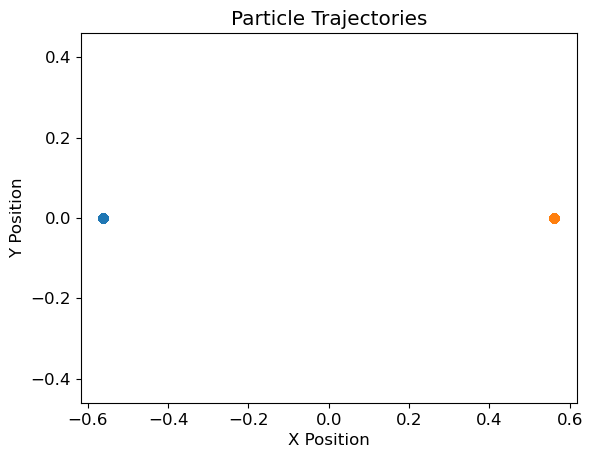

C:\Users\mo241\AppData\Local\Temp\ipykernel_6296\198116572.py:26: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax.set_ylim(np.min(trajectory[..., 1]), np.max(trajectory[..., 1]))


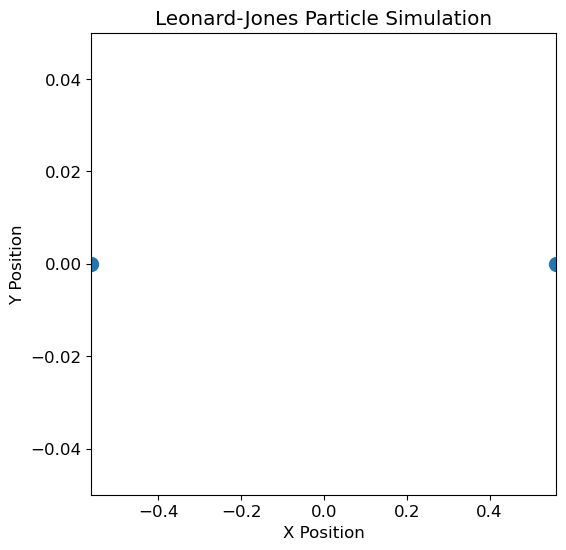

In [8]:
r_min = (2**(1/6)) * sigma


#Might need to fix animate function so it represents the box - set xlim and ylim correctly
#Animation must be bounded by the box
#Or I must create a wrapped and unwrapped trajectory


#Question 3a
R1 = np.array([[-0.5 * r_min, 0], [0.5 * r_min,0]]) 
v0 = np.array([[0,0],[0,0]])
traj1, _ = simulation(R1, v0, np.ones(len(R1)), .01, 10, 1, 1, 3)
plot_traj(traj1)
animate_trajectory(traj1, 3)


# Question 3b

C:\Users\mo241\AppData\Local\Temp\ipykernel_6296\4205053979.py:4: RuntimeWarning: divide by zero encountered in divide
  FRR = 4 * epsilon * (-12 * (sigma / rij) ** 13 + 6*(sigma/rij)**7) / sigma #LJ Force equation
C:\Users\mo241\AppData\Local\Temp\ipykernel_6296\4205053979.py:4: RuntimeWarning: invalid value encountered in add
  FRR = 4 * epsilon * (-12 * (sigma / rij) ** 13 + 6*(sigma/rij)**7) / sigma #LJ Force equation


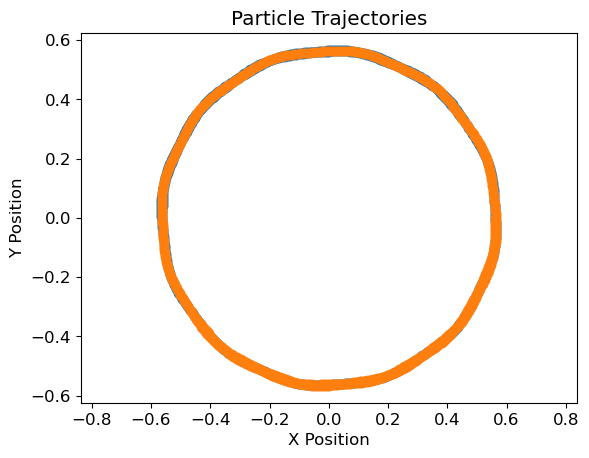

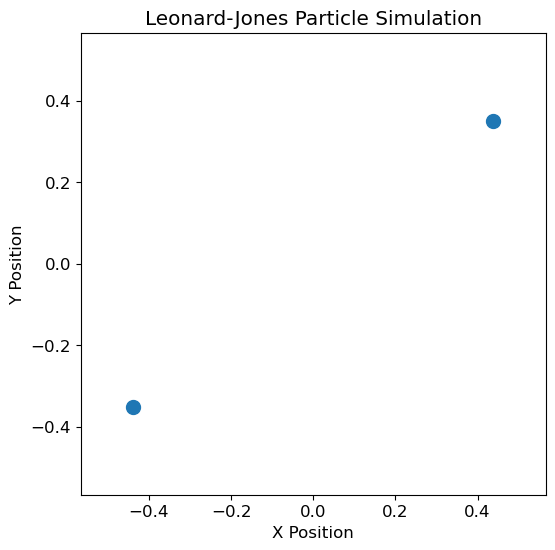

In [9]:
#Question 3b
R2 = np.array([[-0.5 * r_min, 0], [0.5 * r_min,0]]) 
v1 = np.array([[0,0.5],[0,-0.5]])
traj2, _ = simulation(R2, v1, np.ones(len(R2)), .01, 10, 1, 1, 3)
plot_traj(traj2)
animate_trajectory(traj2, 3)

# Question 4

C:\Users\mo241\AppData\Local\Temp\ipykernel_6296\4205053979.py:4: RuntimeWarning: divide by zero encountered in divide
  FRR = 4 * epsilon * (-12 * (sigma / rij) ** 13 + 6*(sigma/rij)**7) / sigma #LJ Force equation
C:\Users\mo241\AppData\Local\Temp\ipykernel_6296\4205053979.py:4: RuntimeWarning: invalid value encountered in add
  FRR = 4 * epsilon * (-12 * (sigma / rij) ** 13 + 6*(sigma/rij)**7) / sigma #LJ Force equation


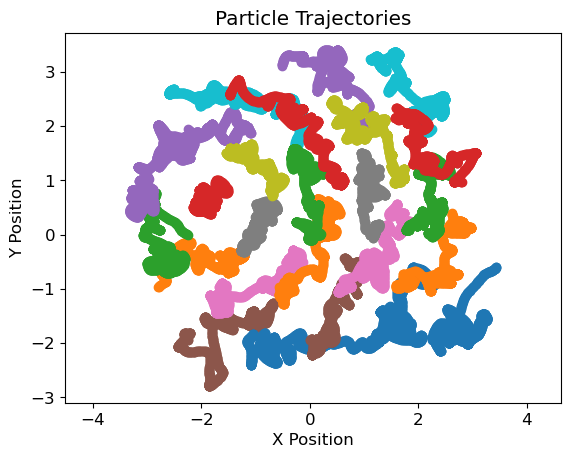

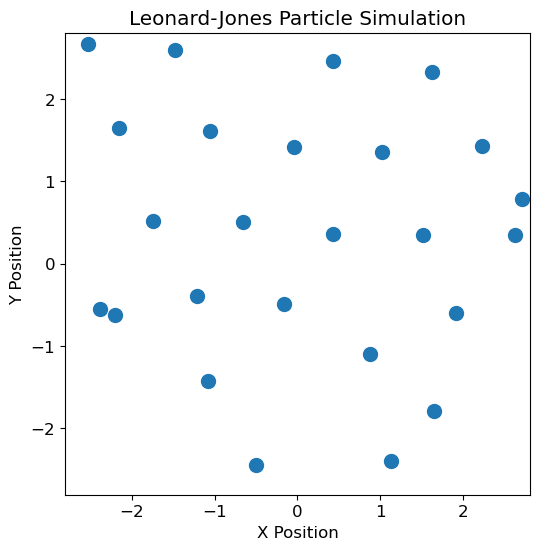

In [10]:
def make_triangular_lattice(origin, N, lattice_constant):
  lattice = np.zeros((N*N,2))
  for i in range(N):
    for j in range(N):
      lattice[i*N + j] = origin + i*np.array([1,0]) + j*np.array([0.5, np.sqrt(3/4)])

  lattice = lattice_constant*(lattice - np.mean(lattice, axis = 0))
  return lattice


#plt.scatter(make_triangular_lattice(np.array([0,0]), 5, 2**(1/6))[:, 0], make_triangular_lattice(np.array([0,0]), 5, 2**(1/6))[:,1])

#Plotted trajectory is incorrect



#Professor Sharma's setup code for triangular lattice
N=5
masses = np.ones(N*N)


L = (N) * (2**(1/6))
positions = shift(make_triangular_lattice(np.array([0,0]), N, 2**(1/6)), L)

v_max = 2
np.random.seed(20)
velocities = v_max*2*(np.random.rand(N*N,2)-0.5)

T, _ =simulation(R_0 = positions, v_0 = velocities, m = masses, t=0.01, t_max=10, sigma=1, epsilon = 1, L=L )
plot_traj(T)
animate_trajectory(T, L)

# Question 5a 

In [11]:
# 21 N's, 5 simulations each for a total of 105 simulations
#Make a time vs N plot (21 values in each array)

#5a is gathering the information for the plot


#Make it into a function

def calculate_tsim(N):
    tsim_avg = np.zeros(len(N))   
    tsim_errors = np.zeros(len(N))

    for step, N_val in enumerate(N):
        masses = np.ones(N_val * N_val)  
        L = N_val * (2**(1/6))  

        positions = shift(make_triangular_lattice(np.array([0,0]), N_val, 2**(1/6)), L)

        np.random.seed(20)
        v_max = 2
        velocities = v_max * 2 * (np.random.rand(N_val * N_val, 2) - 0.5) 

        t_sim_N = np.zeros(5)

        for i in range(5):  # Run 5 simulations per N_val
            _ , t_sim = simulation(R_0=positions, v_0=velocities, m=masses, 
                                     t=0.01, t_max=10, sigma=1, epsilon=1, L=L)
            t_sim_N[i] = t_sim

        # Compute statistics
        tsim_avg[step] = np.mean(t_sim_N)
        tsim_errors[step] = np.std(t_sim_N) / np.sqrt(5)  # Standard error

    return tsim_avg, tsim_errors

# Run the function and plot
N_values = np.arange(10, 31)
tsim_avg, tsim_errors = calculate_tsim(N_values)

print(tsim_avg)
print(tsim_errors)




C:\Users\mo241\AppData\Local\Temp\ipykernel_6296\4205053979.py:4: RuntimeWarning: divide by zero encountered in divide
  FRR = 4 * epsilon * (-12 * (sigma / rij) ** 13 + 6*(sigma/rij)**7) / sigma #LJ Force equation
C:\Users\mo241\AppData\Local\Temp\ipykernel_6296\4205053979.py:4: RuntimeWarning: invalid value encountered in add
  FRR = 4 * epsilon * (-12 * (sigma / rij) ** 13 + 6*(sigma/rij)**7) / sigma #LJ Force equation


[ 0.48417053  0.68723845  1.00532751  1.33234301  1.98346529  2.57716517
  3.7530529   4.82959685  6.36497769  8.64441996 11.12698903 13.43463883
 16.24589834 19.33932443 22.99833498 27.01373634 31.72058239 37.54025002
 43.73096237 50.01838856 60.86033101]
[2.03999045e-03 1.08622002e-03 1.50906494e-02 1.20554608e-02
 2.21021436e-02 1.12786382e-02 7.06765420e-03 1.69124784e-02
 1.11974849e-02 1.23590180e-02 3.85261941e-02 1.47996952e-02
 1.72509513e-02 4.32397669e-02 4.04446444e-02 4.07803418e-02
 1.05843019e-01 2.02039237e-01 1.44553528e-01 3.65202554e-02
 1.37272044e+00]


# Question 5b

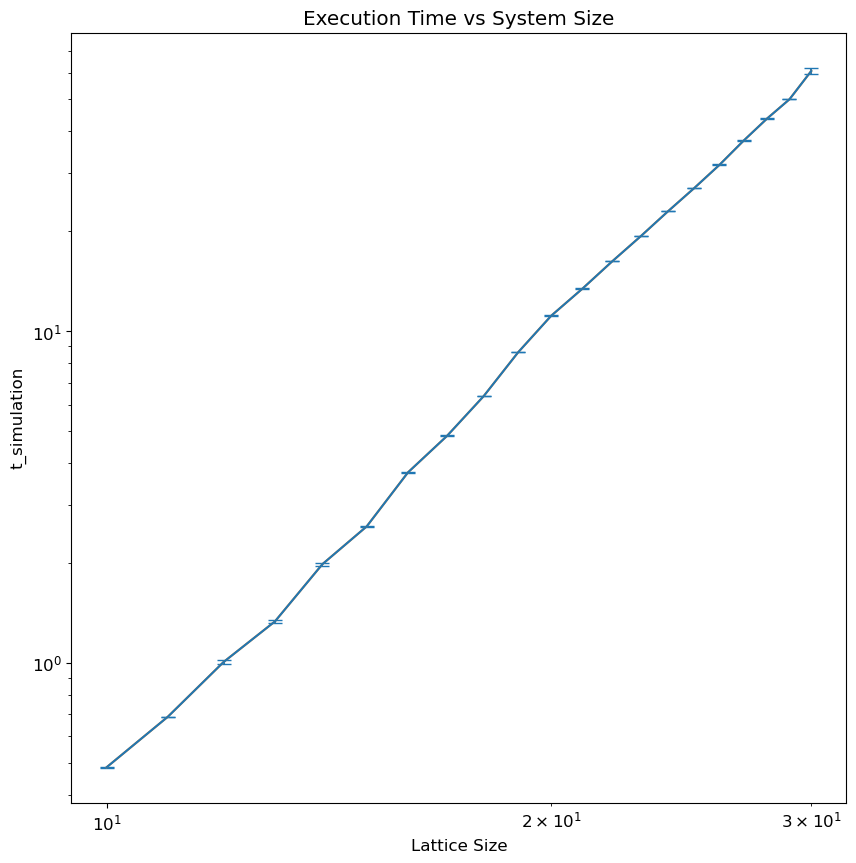

In [12]:
def plot_tsim_vs_N(N, tsim_avg, tsim_errors):
    plt.figure(figsize=(10,10))
    plt.errorbar(N, tsim_avg, yerr=tsim_errors, capsize=5)
    plt.plot(N, tsim_avg)
    plt.xscale('log')
    plt.yscale('log')
    plt.xlabel('Lattice Size')
    plt.ylabel('t_simulation')
    plt.title('Execution Time vs System Size')
    plt.show()

plot_tsim_vs_N(N_values, tsim_avg, tsim_errors)

# Question 5c

From this log-log plot, the slope is somewhat linear and from this the time complexity can be estimated as O(N) or linear time complexity.

# Question 6a (Calculate Momentum)

C:\Users\mo241\AppData\Local\Temp\ipykernel_6296\4205053979.py:4: RuntimeWarning: divide by zero encountered in divide
  FRR = 4 * epsilon * (-12 * (sigma / rij) ** 13 + 6*(sigma/rij)**7) / sigma #LJ Force equation
C:\Users\mo241\AppData\Local\Temp\ipykernel_6296\4205053979.py:4: RuntimeWarning: invalid value encountered in add
  FRR = 4 * epsilon * (-12 * (sigma / rij) ** 13 + 6*(sigma/rij)**7) / sigma #LJ Force equation


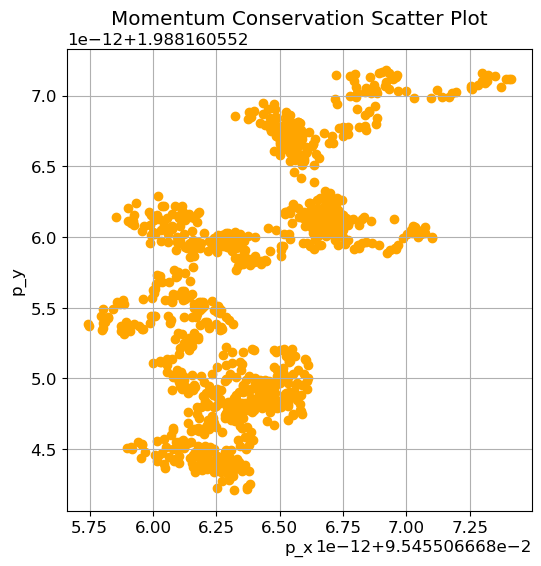

In [13]:
def calc_momentum(trajectory, masses, t):
    velocities = (trajectory[1:] - trajectory[:-1]) / t  
    momentum = masses[np.newaxis, :, np.newaxis] * velocities
    total_momentum = np.sum(momentum, axis=1)  
    return total_momentum 

def plot_momentum(total_momentum):
    plt.figure(figsize=(6,6))
    plt.scatter(total_momentum[:, 0], total_momentum[:, 1], color='orange')
    plt.xlabel("p_x")
    plt.ylabel("p_y")
    plt.title("Momentum Conservation Scatter Plot")
    plt.grid()
    plt.show()

#Professor Sharma's setup code for triangular lattice
N=5
masses = np.ones(N*N)
L = (N) * (2**(1/6))
positions = shift(make_triangular_lattice(np.array([0,0]), N, 2**(1/6)), L)
v_max = 2
np.random.seed(20)
velocities = v_max*2*(np.random.rand(N*N,2)-0.5)

T, _ =simulation(R_0 = positions, v_0 = velocities, m = masses, t=0.01, t_max=10, sigma=1, epsilon = 1, L=L )
total_momentum = calc_momentum(T, masses, t=0.01)
plot_momentum(total_momentum)



# Question 6b (Kinetic Energy)

In [14]:
def calc_KE(trajectory, masses, t):
    velocities = (trajectory[1:] - trajectory[:-1]) / t  
    kinetic_energy = 0.5 * masses[np.newaxis, :] * np.sum(velocities**2, axis=2)
    total_KE = np.sum(kinetic_energy, axis=1)
    return total_KE

# Question 6c

In [15]:
#Potential is for L-J particles
def calc_PE(trajectory, sigma, epsilon):
    n_steps, N, _ = trajectory.shape
    PE = np.zeros(n_steps)

    for step in range(n_steps):
        R = trajectory[step]
        dR, _ = displacements(R, L)
        rij = np.linalg.norm(dR, axis=-1)
        U = 4 * epsilon * ((sigma / rij) ** 12 - (sigma / rij) ** 6)
        U[np.isnan(U)] = 0
        PE[step] = np.nansum(U) / 2 #Avoid double counting
        
    return PE

    

# Question 6d

C:\Users\mo241\AppData\Local\Temp\ipykernel_6296\4205053979.py:4: RuntimeWarning: divide by zero encountered in divide
  FRR = 4 * epsilon * (-12 * (sigma / rij) ** 13 + 6*(sigma/rij)**7) / sigma #LJ Force equation
C:\Users\mo241\AppData\Local\Temp\ipykernel_6296\4205053979.py:4: RuntimeWarning: invalid value encountered in add
  FRR = 4 * epsilon * (-12 * (sigma / rij) ** 13 + 6*(sigma/rij)**7) / sigma #LJ Force equation
C:\Users\mo241\AppData\Local\Temp\ipykernel_6296\3917301711.py:10: RuntimeWarning: divide by zero encountered in divide
  U = 4 * epsilon * ((sigma / rij) ** 12 - (sigma / rij) ** 6)
C:\Users\mo241\AppData\Local\Temp\ipykernel_6296\3917301711.py:10: RuntimeWarning: invalid value encountered in subtract
  U = 4 * epsilon * ((sigma / rij) ** 12 - (sigma / rij) ** 6)


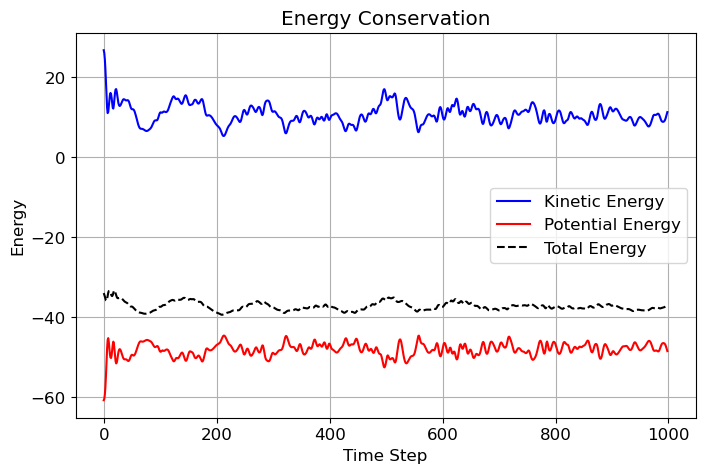

In [16]:
#Professor Sharma's setup code for triangular lattice
N=5
masses = np.ones(N*N)
L = (N) * (2**(1/6))
positions = shift(make_triangular_lattice(np.array([0,0]), N, 2**(1/6)), L)
v_max = 2
np.random.seed(20)
velocities = v_max*2*(np.random.rand(N*N,2)-0.5)

T, _ =simulation(R_0 = positions, v_0 = velocities, m = masses, t=0.01, t_max=10, sigma=1, epsilon = 1, L=L )


KE = calc_KE(T, masses, t=0.01)
PE = calc_PE(T, sigma=1, epsilon=1)

def plot_energies(KE, PE):

    time_steps = np.arange(len(KE))

    total_energy = KE + PE[:-1] #Makes both variables the same shape
    plt.figure(figsize=(8, 5))
    plt.plot(time_steps, KE, label="Kinetic Energy", color="blue")
    plt.plot(time_steps, PE[:-1], label="Potential Energy", color="red")
    plt.plot(time_steps, total_energy, label="Total Energy", color="black", linestyle="dashed")
    plt.xlabel("Time Step")
    plt.ylabel("Energy")
    plt.title("Energy Conservation")
    plt.legend()
    plt.grid()
    plt.show()

plot_energies(KE, PE)
